# Project: Wrangling and Analyze Data

In [1]:
# Import the necessary libraries

import requests 
import json 
import shutil
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

sns.set()


import warnings
warnings.filterwarnings("ignore")

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [2]:
file_ = 'twitter-archive-enhanced.csv'
tweet_data = pd.read_csv(file_, escapechar='\\')

2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [3]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
r = requests.get(url, allow_redirects=True)

In [4]:
#extract downloaded file from request 
open('image-prediictions.tsv', 'wb').write(r.content)

335079

In [5]:
tsv_file = 'image-prediictions.tsv'
image_data = pd.read_table(tsv_file)

3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

#####  Importing the tweet json archive and reading into the file

In [6]:
tweet_data1 = pd.read_json('tweet-json.txt', lines=True)

In [7]:
def unpack(x):
    rv = []
    for v in x: 
        if isinstance(v, dict):
            rv.append([*v.values()][0])
        else:
            rv.append(v)
    return rv

tweet_data_unpacked = tweet_data1.apply(unpack)

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



#### Visually assess the data sets

In [8]:
tweet_data

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


In [9]:
image_data

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [10]:
tweet_data_unpacked

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]",[],"[{'id': 892420639486877696, 'id_str': '8924206...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,This is Tilly. She's just checking pup on you....,False,"[0, 138]",[],"[{'id': 892177413194625024, 'id_str': '8921774...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]",[],"[{'id': 891815175371796480, 'id_str': '8918151...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,4328,25461,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,2017-07-30 15:58:51+00:00,891689557279858688,891689557279858688,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]",[],"[{'id': 891689552724799489, 'id_str': '8916895...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,8964,42908,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,2017-07-29 16:00:24+00:00,891327558926688256,891327558926688256,This is Franklin. He would like you to stop ca...,False,"[0, 138]","[{'text': 'BarkWeek', 'indices': [129, 138]}]","[{'id': 891327551943041024, 'id_str': '8913275...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,9774,41048,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
5,2017-07-29 00:08:17+00:00,891087950875897856,891087950875897856,Here we have a majestic great white breaching ...,False,"[0, 138]","[{'text': 'BarkWeek', 'indices': [129, 138]}]","[{'id': 891087942176911360, 'id_str': '8910879...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,3261,20562,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
6,2017-07-28 16:27:12+00:00,890971913173991426,890971913173991424,Meet Jax. He enjoys ice cream so much he gets ...,False,"[0, 140]",[],"[{'id': 890971906207338496, 'id_str': '8909719...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,2158,12041,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
7,2017-07-28 00:22:40+00:00,890729181411237888,890729181411237888,When you watch your owner call another dog a g...,False,"[0, 118]",[],"[{'id': 890729118844600320, 'id_str': '8907291...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,16716,56848,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
8,2017-07-27 16:25:51+00:00,890609185150312448,890609185150312448,This is Zoey. She doesn't want to be one of th...,False,"[0, 122]","[{'text': 'BarkWeek', 'indices': [113, 122]}]","[{'id': 890609177319665665, 'id_str': '8906091...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,4429,28226,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
9,2017-07-26 15:59:51+00:00,890240255349198849,890240255349198848,This is Cassie. She is a college pup. Studying...,False,"[0, 133]",[],"[{'id': 890240245463175168, 'id_str': '8902402...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4196983835,NaN,NaN,None,NaN,False,7711,32

#### Programatically assess data tables
data types: assess data type of each variable 

unique values: assess if there are duplicate values

counts: number of non null values

missing values: assess number of missing values

In [11]:
# Helper function to inspect and assess the data characteristics
def get_data_summary(data):
    summary = pd.concat([data.dtypes, data.nunique(),
                         data.count(), data.isnull().sum()],
                        keys=["dtypes", "nunique", "count", "missing"],
                        axis=1)
    return summary

In [12]:
get_data_summary(tweet_data)

,dtypes,nunique,count,missing
tweet_id,int64,2356,2356,0
in_reply_to_status_id,float64,77,78,2278
in_reply_to_user_id,float64,31,78,2278
timestamp,object,2356,2356,0
source,object,4,2356,0
text,object,2356,2356,0
retweeted_status_id,float64,181,181,2175
retweeted_status_user_id,float64,25,181,2175
retweeted_status_timestamp,object,181,181,2175
expanded_urls,object,2218,2297,59


In [13]:
get_data_summary(image_data)

,dtypes,nunique,count,missing
tweet_id,int64,2075,2075,0
jpg_url,object,2009,2075,0
img_num,int64,4,2075,0
p1,object,378,2075,0
p1_conf,float64,2006,2075,0
p1_dog,bool,2,2075,0
p2,object,405,2075,0
p2_conf,float64,2004,2075,0
p2_dog,bool,2,2075,0
p3,object,408,2075,0


In [14]:
def get_data_summary1(data):
    summary = pd.concat([data.dtypes,
                         data.count(), data.isnull().sum()],
                        keys=["dtypes", "count", "missing"],
                        axis=1)
    return summary

In [15]:
get_data_summary1(tweet_data_unpacked)

,dtypes,count,missing
created_at,"datetime64[ns, UTC]",2354,0
id,int64,2354,0
id_str,int64,2354,0
full_text,object,2354,0
truncated,bool,2354,0
display_text_range,object,2354,0
entities,object,2354,0
extended_entities,object,2073,281
source,object,2354,0
in_reply_to_status_id,float64,78,2276


In [16]:
# Check for duplicate columns in the 3 data sets
all_columns = pd.Series(list(tweet_data) + list(image_data) + list(tweet_data_unpacked))
all_columns[all_columns.duplicated()]

17                 tweet_id
37                   source
38    in_reply_to_status_id
40      in_reply_to_user_id
dtype: object

In [17]:
tweet_data.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

In [18]:
# Check to see that there are no retweets
tweet_data_unpacked.retweeted.value_counts()

False    2354
Name: retweeted, dtype: int64

In [19]:
# Further checks for retweets
tweet_data.loc[tweet_data['retweeted_status_id'].notnull()]

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
19,888202515573088257,NaN,NaN,2017-07-21 01:02:36 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Canela. She attempted s...,8.874740e+17,4.196984e+09,2017-07-19 00:47:34 +0000,https://twitter.com/dog_rates/status/887473957...,13,10,Canela,None,None,None,None
32,886054160059072513,NaN,NaN,2017-07-15 02:45:48 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @Athletics: 12/10 #BATP https://t.co/WxwJmv...,8.860537e+17,1.960740e+07,2017-07-15 02:44:07 +0000,https://twitter.com/dog_rates/status/886053434...,12,10,None,None,None,None,None
36,885311592912609280,NaN,NaN,2017-07-13 01:35:06 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Lilly. She just paralle...,8.305833e+17,4.196984e+09,2017-02-12 01:04:29 +0000,https://twitter.com/dog_rates/status/830583320...,13,10,Lilly,None,None,None,None
68,879130579576475649,NaN,NaN,2017-06-26 00:13:58 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Emmy. She was adopted t...,8.780576e+17,4.196984e+09,2017-06-23 01:10:23 +0000,https://twitter.com/dog_rates/status/878057613...,14,10,Emmy,None,None,None,None
73,878404777348136964,NaN,NaN,2017-06-24 00:09:53 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Shadow. In an attempt to r...,8.782815e+17,4.196984e+09,2017-06-23 16:00:04 +0000,"https://www.gofundme.com/3yd6y1c,https://twitt...",13,10,Shadow,None,None,None,None
74,878316110768087041,NaN,NaN,2017-06-23 18:17:33 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Terrance. He's being yelle...,6.690004e+17,4.196984e+09,2015-11-24 03:51:38 +0000,https://twitter.com/dog_rates/status/669000397...,11,10,Terrance,None,None,None,None
78,877611172832227328,NaN,NaN,2017-06-21 19:36:23 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @rachel2195: @dog_rates the boyfriend and h...,8.768508e+17,5.128045e+08,2017-06-19 17:14:49 +0000,https://twitter.com/rachel2195/status/87685077...,14,10,None,None,None,pupper,None
91,874434818259525634,NaN,NaN,2017-06-13 01:14:41 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Coco. At first I though...,8.663350e+17,4.196984e+09,2017-05-21 16:48:45 +0000,https://twitter.com/dog_rates/status/866334964...,12,10,Coco,None,None,None,None
95,873697596434513921,NaN,NaN,2017-06-11 00:25:14 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Walter. He won't start ...,8.688804e+17,4.196984e+09,2017-05-28 17:23:24 +0000,https://twitter.com/dog_rates/status/868880397...,14,10,Walter,None,None,None,None
97,873337748698140672,NaN,NaN,2017-06-10 00:35:19 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Sierra. She's one preci...,8.732138e+17,4.196984e+09,2017-06-09 16:22:42 +0000,https://www.gofundme.com/help-my-baby-sierra-g...,12,10,Sierra,None,None,pupper,None


In [20]:
tweet_data.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


In [21]:
image_data.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


In [22]:
tweet_data_unpacked.describe()

,id,id_str,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,user,geo,coordinates,contributors,retweet_count,favorite_count,possibly_sensitive,possibly_sensitive_appealable,quoted_status_id,quoted_status_id_str
count,2.354000e+03,2.354000e+03,7.800000e+01,7.800000e+01,7.800000e+01,7.800000e+01,2.354000e+03,0.0,0.0,0.0,2354.000000,2354.000000,2211.0,2211.0,2.900000e+01,2.900000e+01
mean,7.426978e+17,7.426978e+17,7.455079e+17,7.455079e+17,2.014171e+16,2.014171e+16,4.196984e+09,NaN,NaN,NaN,3164.797366,8080.968564,0.0,0.0,8.162686e+17,8.162686e+17
std,6.852812e+16,6.852812e+16,7.582492e+16,7.582492e+16,1.252797e+17,1.252797e+17,0.000000e+00,NaN,NaN,NaN,5284.770364,11814.771334,0.0,0.0,6.164161e+16,6.164161e+16
min,6.660209e+17,6.660209e+17,6.658147e+17,6.658147e+17,1.185634e+07,1.185634e+07,4.196984e+09,NaN,NaN,NaN,0.000000,0.000000,0.0,0.0,6.721083e+17,6.721083e+17
25%,6.783975e+17,6.783975e+17,6.757419e+17,6.757419e+17,3.086374e+08,3.086374e+08,4.196984e+09,NaN,NaN,NaN,624.500000,1415.000000,0.0,0.0,7.888183e+17,7.888183e+17
50%,7.194596e+17,7.194596e+17,7.038708e+17,7.038708e+17,4.196984e+09,4.196984e+09,4.196984e+09,NaN,NaN,NaN,1473.500000,3603.500000,0.0,0.0,8.340867e+17,8.340867e+17
75%,7.993058e+17,7.993058e+17,8.257804e+17,8.257804e+17,4.196984e+09,4.196984e+09,4.196984e+09,NaN,NaN,NaN,3652.000000,10122.250000,0.0,0.0,8.664587e+17,8.664587e+17
max,8.924206e+17,8.924206e+17,8.862664e+17,8.862664e+17,8.405479e+17,8.405479e+17,4.196984e+09,NaN,NaN,NaN,79515.000000,132810.000000,0.0,0.0,8.860534e+17,8.860534e+17


### Quality issues

1. tweet_data table and tweet_data_unpacked: contain retweets

2. tweet_data table and tweet_data_unpacked: Missing values

3. tweet_data table: Inconsistent data entries in ratings denominator

4. tweet_data table: Erroneous data types

5. tweet_data and tweet_data_unpacked: Variable values are too long for meaningful analysis

6. tweet_data table: multiple dog stages for some observations

7. tweet_data table: Errors in data values in ratings numerator

8. 

### Tidiness issues
1. image_data table: Non-descriptive column headers

2. tweet_data table: Some variables form multiple columns instead of one 

In [23]:
# merge the 3 data tables
tweet_data_unpacked.rename({"id":"tweet_id"}, axis=1,  inplace=True)
df = pd.merge(tweet_data, image_data, how = 'outer', on=['tweet_id', 'tweet_id'])
df = df.merge(tweet_data_unpacked, how ='outer', on='tweet_id')

In [24]:
# Check for duplicate tweet id in the merged table
df[df.tweet_id.duplicated()]

,tweet_id,in_reply_to_status_id_x,in_reply_to_user_id_x,timestamp,source_x,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,source_y,in_reply_to_status_id_y,in_reply_to_status_id_str,in_reply_to_user_id_y,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status


In [25]:
df.head()

,tweet_id,in_reply_to_status_id_x,in_reply_to_user_id_x,timestamp,source_x,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,source_y,in_reply_to_status_id_y,in_reply_to_status_id_str,in_reply_to_user_id_y,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,2017-08-01 16:23:56+00:00,8.924206e+17,This is Phineas. He's a mystical boy. Only eve...,False,"[0, 85]",[],"[{'id': 892420639486877696, 'id_str': '8924206...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4.196984e+09,NaN,NaN,None,NaN,False,8853.0,39467.0,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,2017-08-01 00:17:27+00:00,8.921774e+17,This is Tilly. She's just checking pup on you....,False,"[0, 138]",[],"[{'id': 892177413194625024, 'id_str': '8921774...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4.196984e+09,NaN,NaN,None,NaN,False,6514.0,33819.0,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,2017-07-31 00:18:03+00:00,8.918152e+17,This is Archie. He is a rare Norwegian Pouncin...,False,"[0, 121]",[],"[{'id': 891815175371796480, 'id_str': '8918151...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4.196984e+09,NaN,NaN,None,NaN,False,4328.0,25461.0,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1.0,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False,2017-07-30 15:58:51+00:00,8.916896e+17,This is Darla. She commenced a snooze mid meal...,False,"[0, 79]",[],"[{'id': 891689552724799489, 'id_str': '8916895...","<a href=""http://twitter.com/download/iphone"" r...",NaN,NaN,NaN,NaN,None,4.196984e+09,NaN,NaN,None,NaN,False,8964.0,42908.0,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2.0,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True,2017-07-29 16:00:24+00:00,8.913276e+17,Thi

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [26]:
# Make copies of original pieces of data
df_clean1 = df.copy()

In [27]:
df_clean1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2356 entries, 0 to 2355
Data columns (total 58 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   tweet_id                       2356 non-null   int64              
 1   in_reply_to_status_id_x        78 non-null     float64            
 2   in_reply_to_user_id_x          78 non-null     float64            
 3   timestamp                      2356 non-null   object             
 4   source_x                       2356 non-null   object             
 5   text                           2356 non-null   object             
 6   retweeted_status_id            181 non-null    float64            
 7   retweeted_status_user_id       181 non-null    float64            
 8   retweeted_status_timestamp     181 non-null    object             
 9   expanded_urls                  2297 non-null   object             
 10  rating_numerator        

## Tidiness issues

### Issue #1: Non-descriptive column headers

#### Define:
Some column headers are not decriptive enough for us to know what the variable is about

Select all nondescriptive column headers (p1, p1_conf, p1_dog, p2, p2_conf, p2_dog, p3, 31_conf, p3_dog, lang, source and rename them with full words (dog_img_prediction1, prediction1_confident,prediction1_dog,dog_img_prediction2, prediction2_confident,prediction2_dog,dog_img_prediction3, prediction3_confident,prediction4_dog, language, tweet_source )

#### Code

In [28]:
# Check column names
df_clean1.columns

Index(['tweet_id', 'in_reply_to_status_id_x', 'in_reply_to_user_id_x', 'timestamp', 'source_x', 'text', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator', 'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2', 'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog', 'created_at', 'id_str', 'full_text', 'truncated', 'display_text_range', 'entities', 'extended_entities', 'source_y', 'in_reply_to_status_id_y', 'in_reply_to_status_id_str', 'in_reply_to_user_id_y', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place', 'contributors', 'is_quote_status', 'retweet_count', 'favorite_count', 'favorited', 'retweeted', 'possibly_sensitive', 'possibly_sensitive_appealable', 'lang', 'retweeted_status', 'quoted_status_id', 'quoted_status_id_str', 'quoted_status'], dtype='object')

In [29]:
# Rename non descriptive column names
df_clean1.rename(columns={'p1': 'dog_img_prediction1',
                                    'p1_conf': 'prediction1_confident',
                                   'p1_dog':'prediction1_dog',
                                   'p2': 'dog_img_prediction2',
                                    'p2_conf': 'prediction2_confident',
                                   'p2_dog':'prediction2_dog',
                                   'p3': 'dog_img_prediction3',
                                    'p3_conf': 'prediction3_confident',
                                   'p3_dog':'prediction3_dog',
                        'lang': 'language', 'source_x': 'tweet_source'}, inplace = True)

#### Test

In [30]:
# Check if changes to colunm names have been effected
df_clean1.columns

Index(['tweet_id', 'in_reply_to_status_id_x', 'in_reply_to_user_id_x', 'timestamp', 'tweet_source', 'text', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator', 'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo', 'jpg_url', 'img_num', 'dog_img_prediction1', 'prediction1_confident', 'prediction1_dog', 'dog_img_prediction2', 'prediction2_confident', 'prediction2_dog', 'dog_img_prediction3', 'prediction3_confident', 'prediction3_dog', 'created_at', 'id_str', 'full_text', 'truncated', 'display_text_range', 'entities', 'extended_entities', 'source_y', 'in_reply_to_status_id_y', 'in_reply_to_status_id_str', 'in_reply_to_user_id_y', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo', 'coordinates', 'place', 'contributors', 'is_quote_status', 'retweet_count', 'favorite_count', 'favorited', 'retweeted', 'possibly_sensitive', 'possibly_sensitive_appealable', 'language', 'retweeted_status',
       '

### Issue #2: Some variables form multiple columns instead of one

#### Define: 
Some variables form multiple columns:doggo,floofer,pupper,puppo columns are all dog stages and should form a column

Merge the variable values in the various columns to one column to from a dog stage variable

#### Code

In [31]:
df_clean1.columns[13:17]

Index(['doggo', 'floofer', 'pupper', 'puppo'], dtype='object')

In [32]:
def replace_values(row): 
    
    value = None
    value_list = []
    for col in df_clean1.columns[13:17]:
        if row[col] is not None:
            value = row[col]
            value_list.append(value)
            if len(value_list) != 0:
                value = ''.join([val for val in value_list if not val.startswith('N')])
                
    return value
            

In [33]:
df_clean1['dog_stage'] = df_clean1.apply(replace_values, axis=1)
df_clean1['dog_stage'] = df_clean1['dog_stage'].replace("", 'None')
df_clean1['dog_stage'] = df_clean1['dog_stage'].replace({"doggopupper":"doggo, pupper", 
                                                            "doggopuppo":"doggo, puppo", 
                                                            "doggofloofer":"doggo, floofer"})

#### Test

In [34]:
# Test the to see the new dog stage column
df_clean1['dog_stage'].value_counts()

None              1976
pupper             245
doggo               83
puppo               29
doggo, pupper       12
floofer              9
doggo, puppo         1
doggo, floofer       1
Name: dog_stage, dtype: int64

## Quality issues

### Issue #1: Data set contains retweets

#### Define 
Only original ratings (no retweets) that have images are needed. The data set contain retweets 

Remove rows(tweets) that are retweets

#### Code

In [35]:
# Check how many tweets are retweets 
len(df_clean1[df_clean1["retweeted_status_id"].notnull()])

181

In [36]:
# Remove retweets by keeping tweets with no retweet status id
df_clean1 = df_clean1[df_clean1["retweeted_status_id"].isnull()]

#### Test

In [37]:
# Confirm that retweets have been removed 
df_clean1.text.astype(str)
df_clean1.loc[df_clean1['text'].str.startswith('RT @')]

,tweet_id,in_reply_to_status_id_x,in_reply_to_user_id_x,timestamp,tweet_source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,dog_img_prediction1,prediction1_confident,prediction1_dog,dog_img_prediction2,prediction2_confident,prediction2_dog,dog_img_prediction3,prediction3_confident,prediction3_dog,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,source_y,in_reply_to_status_id_y,in_reply_to_status_id_str,in_reply_to_user_id_y,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,language,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status,dog_stage


In [38]:
len(df_clean1[df_clean1["retweeted_status_id"].notnull()])

0

### Issue #2: Missing values

#### Define 
Some variables have majority of the observations missing and can therefore not be used for any meaningful analysis

we remove such variables


In [39]:
df_clean1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 59 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   tweet_id                       2175 non-null   int64              
 1   in_reply_to_status_id_x        78 non-null     float64            
 2   in_reply_to_user_id_x          78 non-null     float64            
 3   timestamp                      2175 non-null   object             
 4   tweet_source                   2175 non-null   object             
 5   text                           2175 non-null   object             
 6   retweeted_status_id            0 non-null      float64            
 7   retweeted_status_user_id       0 non-null      float64            
 8   retweeted_status_timestamp     0 non-null      object             
 9   expanded_urls                  2117 non-null   object             
 10  rating_numerator        

#### Code

In [40]:
# Drop variables with majority of the values missing
df_clean1 = df_clean1.drop(['in_reply_to_status_id_x', 'in_reply_to_user_id_x', 'retweeted_status_id', 'retweeted_status_user_id',
                         'retweeted_status_timestamp','in_reply_to_status_id_y', 'in_reply_to_status_id_str', 
                          'in_reply_to_user_id_y', 'in_reply_to_user_id_str', 'in_reply_to_screen_name',
                        'geo', 'coordinates', 'place', 'contributors', 'retweeted_status', 'quoted_status_id',
                         'quoted_status_id_str', 'quoted_status','source_y'], axis=1)

#### Test

In [41]:
df_clean1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   tweet_id                       2175 non-null   int64              
 1   timestamp                      2175 non-null   object             
 2   tweet_source                   2175 non-null   object             
 3   text                           2175 non-null   object             
 4   expanded_urls                  2117 non-null   object             
 5   rating_numerator               2175 non-null   int64              
 6   rating_denominator             2175 non-null   int64              
 7   name                           2175 non-null   object             
 8   doggo                          2175 non-null   object             
 9   floofer                        2175 non-null   object             
 10  pupper                  

### Issue #3: Inconsistent data in ratings denominator

#### Define
Inconsistent entries in ratings denominator, the denominator should ideally be 10, there are some entries less than or greater than 10

To ensure consistency Change all values less or greater than 10 to 10

#### Code

In [42]:
df_clean1['rating_denominator'].value_counts()

10     2153
50        3
11        2
20        2
80        2
15        1
70        1
7         1
150       1
170       1
0         1
90        1
40        1
130       1
110       1
16        1
120       1
2         1
Name: rating_denominator, dtype: int64

In [43]:
# For consistency, Change all values less or greater than 10 to 10
df_clean1['rating_denominator'] = np.where((df_clean1['rating_denominator'] > 10), 10, 
        np.where((df_clean1['rating_denominator'] < 10), 10, df_clean1['rating_denominator'])
        )

#### Test

In [44]:
# Check to see all values in denominator ratings = 10
df_clean1.rating_denominator.value_counts()

10    2175
Name: rating_denominator, dtype: int64

### Issue #4: Erroneous data types

#### Define
Timestamp is an object data type instead of a datetime, some variable with true/false values are objects instead of boolean

Change the data type from object to datetime, also change created_at to datetime without utc to ensure consistency

#### Code

In [45]:
df_clean1.prediction1_dog.value_counts()

True     1477
False     517
Name: prediction1_dog, dtype: int64

In [46]:
# Change variables with true/false values to boolean
df_clean1 = df_clean1.replace({'True': True, 'False': False})

In [47]:
# Change timestamps to date time without utc
df_clean1['timestamp'] = pd.to_datetime(df_clean1['timestamp']).dt.tz_localize(None)
df_clean1['created_at'] = pd.to_datetime(df_clean1['created_at']).dt.tz_localize(None)

#### Test

In [48]:
df_clean1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2175 entries, 0 to 2355
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   tweet_id                       2175 non-null   int64         
 1   timestamp                      2175 non-null   datetime64[ns]
 2   tweet_source                   2175 non-null   object        
 3   text                           2175 non-null   object        
 4   expanded_urls                  2117 non-null   object        
 5   rating_numerator               2175 non-null   int64         
 6   rating_denominator             2175 non-null   int64         
 7   name                           2175 non-null   object        
 8   doggo                          2175 non-null   object        
 9   floofer                        2175 non-null   object        
 10  pupper                         2175 non-null   object        
 11  puppo            

### Issue #5: Variable values are too long for meaningful analysis

#### Define 
variables values are too long to use for meaningful analysis

Replace such values with more appropriate values for analysis

In [49]:
df_clean1.tweet_source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2042
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       31
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: tweet_source, dtype: int64

#### Code

In [50]:
# replace values with more useful values for analysis
df_clean1['tweet_source'] = df_clean1['tweet_source'].replace({'<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>': 'Twitter for iphone',
    '<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>': 'Vine',
    '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>': 'Twitter web',
    '<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>':'Tweetdeck'})

#### Test

In [51]:
df_clean1.tweet_source.value_counts()

Twitter for iphone    2042
Vine                    91
Twitter web             31
Tweetdeck               11
Name: tweet_source, dtype: int64

### Issue #6: multiple dog stages for some observations

#### Define
Some obseravtions have 2 values for dog_stage

Look through the text to ascertain the correct/nearest value and replace with one value only

#### Code


In [52]:
# check the dog stages
df_clean1.dog_stage.value_counts()

None              1831
pupper             224
doggo               75
puppo               24
doggo, pupper       10
floofer              9
doggo, puppo         1
doggo, floofer       1
Name: dog_stage, dtype: int64

In [53]:
# Scan through text to ascertain correct/closest in value dog stage
df_clean1.loc[df_clean1["dog_stage"].isin(['doggo, puppo','doggo, floofer','doggo, pupper']),['text','dog_stage']]

,text,dog_stage
191,Here's a puppo participating in the #ScienceMa...,"doggo, puppo"
200,"At first I thought this was a shy doggo, but i...","doggo, floofer"
460,"This is Dido. She's playing the lead role in ""...","doggo, pupper"
531,Here we have Burke (pupper) and Dexter (doggo)...,"doggo, pupper"
565,"Like doggo, like pupper version 2. Both 11/10 ...","doggo, pupper"
575,This is Bones. He's being haunted by another d...,"doggo, pupper"
705,This is Pinot. He's a sophisticated doggo. You...,"doggo, pupper"
733,"Pupper butt 1, Doggo 0. Both 12/10 https://t.c...","doggo, pupper"
889,"Meet Maggie &amp; Lila. Maggie is the doggo, L...","doggo, pupper"
956,Please stop sending it pictures that don't eve...,"doggo, pupper"


In [54]:
# replace with one correct/nearest dog stage
df_clean1.dog_stage= df_clean1['dog_stage'].replace({'doggo, puppo': 'puppo', 'doggo, floofer': 'floofer', 'doggo, pupper': 'doggo'})

#### Test

In [55]:
df_clean1.dog_stage.value_counts()

None       1831
pupper      224
doggo        85
puppo        25
floofer      10
Name: dog_stage, dtype: int64

### Issue #7: Errors in data values in ratings numerator

#### Define

* Assumption: ratings higher than 20 might have been error

Some data values in ratings numerator were extracted wrongly

Replace incorrect values extracted with correct values from the text

#### Code

In [56]:
# Scan through text to see values that might have been entered wrongly
pd.set_option('display.max_colwidth', 1000)
df_clean1.loc[:, ['tweet_id','text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
0,892420643555336193,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10
1,892177421306343426,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10
2,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10
3,891689557279858688,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10
4,891327558926688256,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10
5,891087950875897856,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13,10
6,890971913173991426,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13,10
7,890729181411237888,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13,10
8,890609185150312448,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13,10
9,890240255349198849,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14,10


In [57]:
# Assumption that ratings higher than 20 might have been error
df_clean1.loc[df_clean1['rating_numerator']>20, ['tweet_id','text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
188,855862651834028034,@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research,420,10
189,855860136149123072,"@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",666,10
290,838150277551247360,@markhoppus 182/10,182,10
313,835246439529840640,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",960,10
433,820690176645140481,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,84,10
516,810984652412424192,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,10
695,786709082849828864,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",75,10
763,778027034220126208,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,27,10
902,758467244762497024,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,165,10
979,749981277374128128,This is Atticus. He's quite simply America af. 1776/10 https://t.co/GRXwMxLBkh,1776,10


In [58]:
# Replace values; the rating numerator for this tweet_id from the visual assessment was 5 instead of 13 as seen in the text
df_clean1.loc[df_clean1.tweet_id==883482846933004288, 'rating_numerator'] = 13

In [59]:
# Replace values: from the visual assessment of the text we see that some of the values are incorrect 
df_clean1.rating_numerator = df_clean1.rating_numerator.replace({75:9, 27:11, 50:11, 26:11})

#### Test

In [60]:
df_clean1.loc[df_clean1['tweet_id']==883482846933004288, ['tweet_id','text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
45,883482846933004288,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",13,10


In [61]:
# Check values have been replaced
df_clean1.loc[df_clean1['rating_numerator']== {75,27,50,26}, ['tweet_id','text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator


### Issue #8: 
#### Define
#### Code
#### Test

## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [62]:
df_clean1.to_csv("twitter_archive_master.csv",index=False)

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

In [63]:
data = pd.read_csv('twitter_archive_master.csv')

In [64]:
data.head()

,tweet_id,timestamp,tweet_source,text,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo,jpg_url,img_num,dog_img_prediction1,prediction1_confident,prediction1_dog,dog_img_prediction2,prediction2_confident,prediction2_dog,dog_img_prediction3,prediction3_confident,prediction3_dog,created_at,id_str,full_text,truncated,display_text_range,entities,extended_entities,user,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,language,dog_stage
0,892420643555336193,2017-08-01 16:23:56,Twitter for iphone,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False,2017-08-01 16:23:56,8.924206e+17,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,False,"[0, 85]",[],"[{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'pic.twitter.com/MgUWQ76dJU', 'expanded_url': 'https://twitter.com/dog_rates/status/892420643555336193/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 540, 'h': 528, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 540, 'h': 528, 'resize': 'fit'}, 'medium': {'w': 540, 'h': 528, 'resize': 'fit'}}}]",4.196984e+09,False,8853.0,39467.0,False,False,0.0,0.0,en,None
1,892177421306343426,2017-08-01 00:17:27,Twitter for iphone,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1.0,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True,2017-08-01 00:17:27,8.921774e+17,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",False,"[0, 138]",[],"[{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'url': 'https://t.co/0Xxu71qeIV', 'display_url': 'pic.twitter.com/0Xxu71qeIV', 'expanded_url': 'https://twitter.com/dog_rates/status/892177421306343426/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1407, 'h': 1600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 598, 'h': 680, 'resize': 'fit'}, 'medium': {'w': 1055, 'h': 1200, 'resize': 'fit'}}}]",4.196984e+09,False,6514.0,33819.0,False,False,0.0,0.0,en,None
2,891815181378084864,2017-07-31 00:18:03,Twitter for iphone,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1.0,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True,2017-07-31 00:18:03,8.918152e+17,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,False,"[0, 121]",[],"[{'id': 891815175371796480, 'id_str': '891815175371796480', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'url': 'https://t.co/wUnZnhtVJB', 'display_url': 'pic.twitter.com/wUnZnhtVJB', 'expanded

In [65]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2175 entries, 0 to 2174
Data columns (total 40 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   tweet_id                       2175 non-null   int64  
 1   timestamp                      2175 non-null   object 
 2   tweet_source                   2175 non-null   object 
 3   text                           2175 non-null   object 
 4   expanded_urls                  2117 non-null   object 
 5   rating_numerator               2175 non-null   int64  
 6   rating_denominator             2175 non-null   int64  
 7   name                           2175 non-null   object 
 8   doggo                          2175 non-null   object 
 9   floofer                        2175 non-null   object 
 10  pupper                         2175 non-null   object 
 11  puppo                          2175 non-null   object 
 12  jpg_url                        1994 non-null   o

### Insights:

1. Assess the platform used to tweet

In [66]:
data.tweet_source.value_counts()

Twitter for iphone    2042
Vine                    91
Twitter web             31
Tweetdeck               11
Name: tweet_source, dtype: int64

Majority of the tweets were tweeted using Twitter app on Iphone 

2. Ascertain the percentage of dog ratings 10 and above

In [67]:
(sum(data.rating_numerator>=10)/data.rating_numerator.count())*100

80.18390804597702

80% of the dog ratings were 10 or above

3. Ascertain the most retweeted and favourited tweet

In [68]:
data.loc[data['retweet_count']== data.retweet_count.max(), ['tweet_id', 'text','retweet_count']]

,tweet_id,text,retweet_count
862,744234799360020481,Here's a doggo realizing you can stand in a pool. 13/10 enlightened af (vid by Tina Conrad) https://t.co/7wE9LTEXC4,79515.0


In [69]:
data.loc[data['favorite_count']== data.favorite_count.max(),['tweet_id', 'text','favorite_count']]

,tweet_id,text,favorite_count
348,822872901745569793,Here's a super supportive puppo participating in the Toronto #WomensMarch today. 13/10 https://t.co/nTz3FtorBc,132810.0


### Visualization

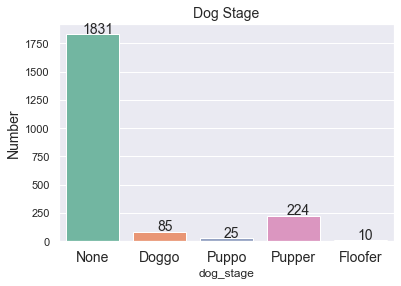

In [70]:
# Visualize the distribution of dog stages
ax = sns.countplot(data = data, x = 'dog_stage', palette="Set2")
labels = ['None', 'Doggo', 'Puppo','Pupper', 'Floofer']
ax.set_ylabel('Number', fontsize=14)
ax.set_title('Dog Stage', fontsize=14 )
ax.set_xticklabels(labels, fontsize=14)
for bar in ax.patches: 

    ax.annotate(format(bar.get_height(), '.0f'),  
                   (bar.get_x() + bar.get_width() / 2,  
                    bar.get_height()), ha='center', va='center', 
                   size=14, xytext=(5, 5), 
                   textcoords='offset points')